# Power calculations with Pf-Tent
Our goal is to identify antigenic loci in Pf genome based on wgs sequencing & metadata from longitudinal birth cohorts. In theory, we should have a record of every Pf infection a child had while developing immunity to malaria. Here I'm using a longitudinal model of within-host malaria dynamics -- Pf-tent -- to perform power calculations to see if this goal is possible.

I hypothesize that if an antigenic allele has been observed before, future infections with parasites carrying that allele will result in shorter infection lengths & lower parasite density. Similarly, I hypothesize that we will have a lower probability of observing that allele again compared to alleles at non-antigenic loci.

In [2]:
import pfTent as tent
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats as st

## Validating Pf-tent
First, I just want to make sure that pf-tent is working as expected and resulting in reasonable dynamics. Let's check results of simulations for 100 people.

In [3]:
y=3 # Simulate for 5 years
a = [10,10,10,10] # control,antigenic loci 1, antigenic loci 2, antigenic loci 3
w = [0,0,0.333333,0.3333333,0.333333] # general immunity, control, antigenic loci 1, antigenic loci 2, antigenic loci 3
n_people = 100
fever, breaks = tent.load_data()
gamma = 1/25
delta = 1/250

In [4]:
all_parasites = np.zeros((n_people, len(a), max(a), y*365))
all_strain_immunity = np.zeros((n_people, len(a), max(a), y*365))
all_gen_immunity = np.zeros((n_people,y*365))
all_parasite_density = []
all_infection_lengths = []
all_MOI = []
all_percent_parasitemia = []
all_malaria_rate = []

for person in range(n_people):
    pmatrix, smatrix, imatrix, ivector, malaria = tent.simulate_person(y,a,w,fever,breaks, gamma=gamma,delta=delta)
    
    Parasitemia, perPositivity = tent.check_parasitemia(3,pmatrix)
    MOI = tent.check_moi(3,smatrix)
    infectionlengths = tent.check_infection_length(smatrix,y,malaria)
    malaria_per_year = len(malaria)/y
    
    all_parasites[person,:,:,:] = pmatrix
    all_strain_immunity[person,:,:,:] = imatrix
    all_gen_immunity[person,:] = ivector
    all_parasite_density.extend(Parasitemia)
    all_infection_lengths.extend(infectionlengths)
    all_MOI.extend(MOI)
    all_percent_parasitemia.append(perPositivity)
    all_malaria_rate.append(malaria_per_year)

/Users/cwagner2/Work/projects/malaria/pf-longitudinal-antigens/immunity-sims/pf-tent/pfTent.py:159: RuntimeWarning: divide by zero encountered in double_scalars
  new_param = param/(c/np.tan(np.pi/2*x)**b+1)


In [6]:
all_parasite_density = np.asarray(all_parasite_density)
logPdensity = np.log10(all_parasite_density[all_parasite_density != 0])

Parasite density
min:0.0
max:1552219.1341692593
median:84.31882646124663
mean:1343.3379446948072
std:29924.01948101839
---------------------
Infection length
min:1
max:378
median:120.0
mean:130.84264392324093
std:67.73065286224643
---------------------
MOI
min:0
max:17
median:7.0
mean:6.507837837837838
std:3.95900522253783
---------------------
% Parasitemia
min:0.7297297297297297
max:0.972972972972973
median:0.8648648648648649
mean:0.8656756756756758
std:0.051059626554081076
---------------------
Malaria cases per year
min:0.8
max:2.4
median:1.5
mean:1.5300000000000002
std:0.4150903516103452
---------------------


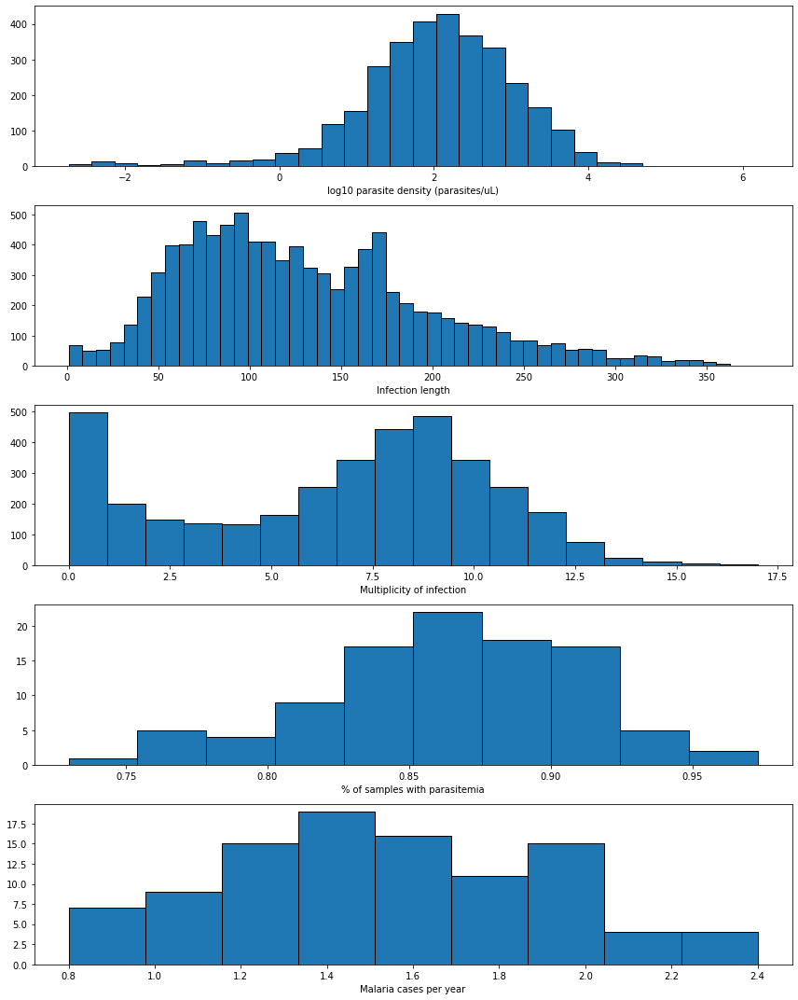

In [22]:
fig,ax = plt.subplots(nrows = 5, tight_layout=True, figsize=(12,15))
ax[0].hist(logPdensity, bins=30, edgecolor = "black")
ax[0].set_xlabel('log10 parasite density (parasites/uL)')
#ax[0].set_yscale('log')
#ax[0].set_xscale('log')
ax[1].hist(all_infection_lengths, bins=50, edgecolor = "black")
ax[1].set_xlabel('Infection length')
ax[2].hist(all_MOI, bins=(max(all_MOI)+1), edgecolor = "black")
ax[2].set_xlabel('Multiplicity of infection')
ax[3].hist(all_percent_parasitemia, bins=10, edgecolor = "black")
ax[3].set_xlabel('% of samples with parasitemia')
ax[4].hist(all_malaria_rate, bins=9, edgecolor = "black")
ax[4].set_xlabel('Malaria cases per year')

fig.savefig("validation_long.pdf")

results = [all_parasite_density, all_infection_lengths, all_MOI, all_percent_parasitemia, all_malaria_rate]
labels = ['Parasite density', 'Infection length', 'MOI', '% Parasitemia', 'Malaria cases per year']

for values, l in zip(results, labels):
    print(l)
    print('min:' + str(min(values)))
    print('max:' + str(max(values)))
    print('median:' + str(np.median(values)))
    print('mean:' + str(np.average(values)))
    print('std:' + str(np.std(values)))
    print('---------------------')

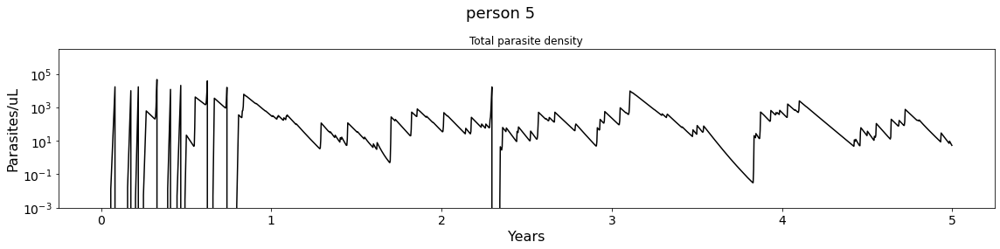

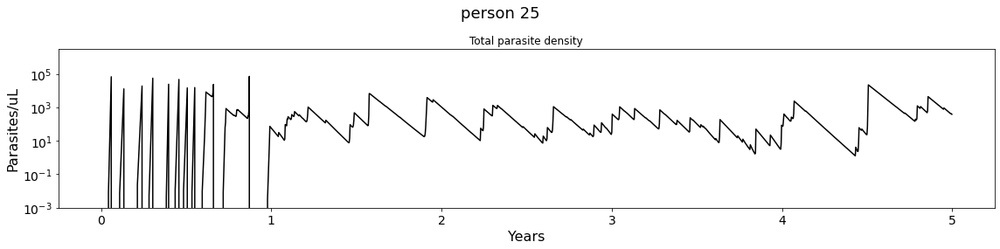

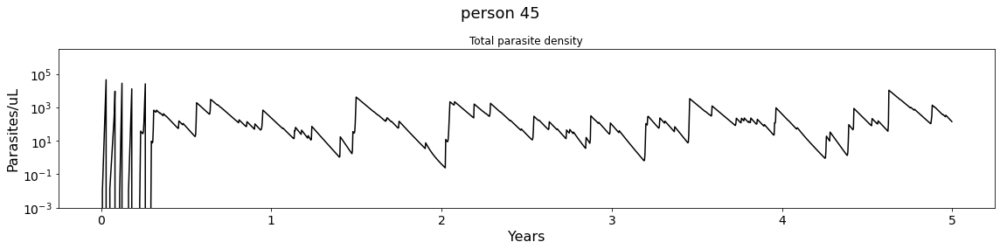

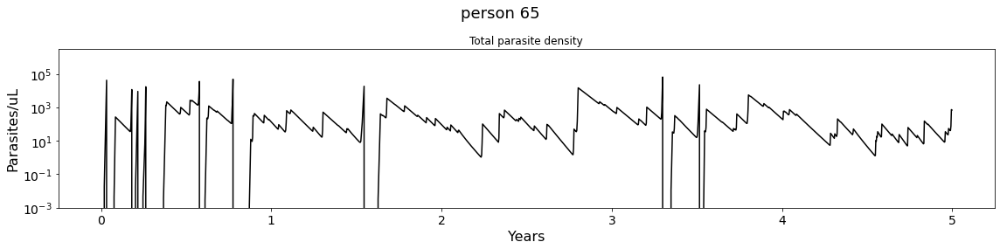

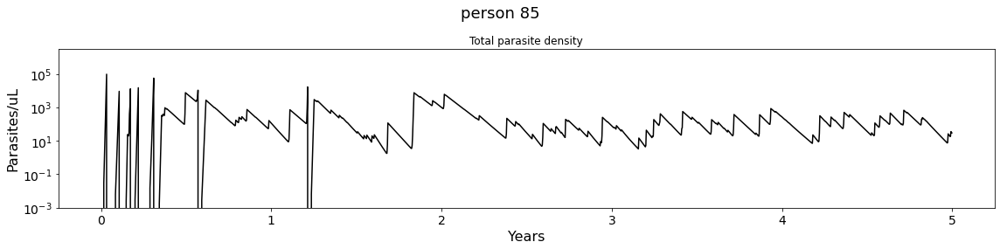

In [15]:
for i in range(5,n_people,20):
    fig, ax = plt.subplots(tight_layout=True, figsize=(16\,4))
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_yscale('log')
    ax.plot(np.arange(y*365)/365, all_parasites[i,-1,:,:].sum(axis=0),color="black")

    ax.set_ylim(0.001,3000000)
    fig.suptitle('person ' + str(i),fontsize=18)
    ax.set_xlabel('Years',fontsize=16)
    ax.set_ylabel('Parasites/uL',fontsize=16)
    ax.set_title('Total parasite density')
    fig.savefig('total_trajectory_'+str(i)+'.pdf')

IndexError: index 7 is out of bounds for axis 0 with size 7

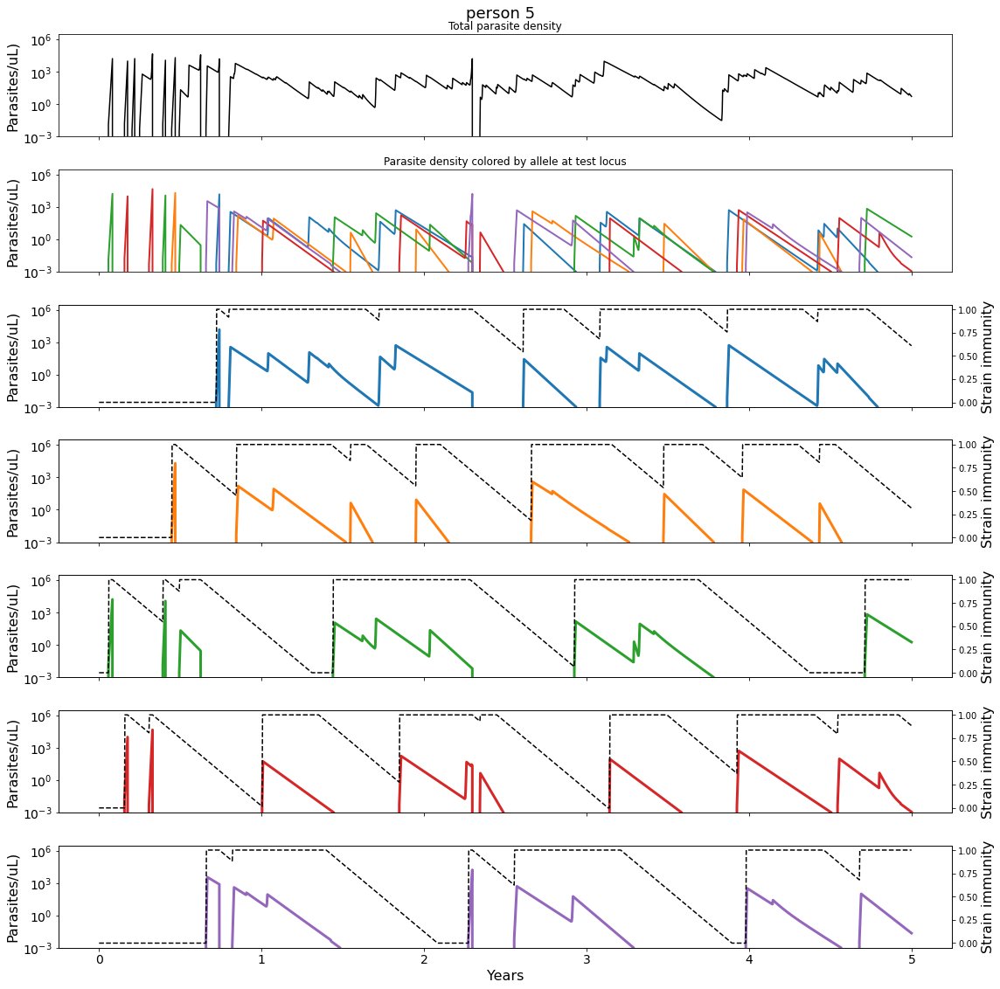

In [9]:
colors = {0:"tab:blue", 1:"tab:orange", 2:"tab:green", 3:"tab:red", 4:"tab:purple"}

for i in range(5,n_people,20):
    fig, ax = plt.subplots(nrows=7, sharey=True, sharex=True, tight_layout=True, figsize=(16,16))
    ax[0].tick_params(axis='both', which='major', labelsize=14)
    ax[1].tick_params(axis='both', which='major', labelsize=14)
    ax[0].set_yscale('log')
    ax[0].plot(np.arange(y*365)/365, all_parasites[i,-1,:,:].sum(axis=0),color="black")
    for strain in np.arange(5):
        iStrain = all_parasites[i,-1,strain,:]
        if np.sum(iStrain) > 1:
            ax[1].plot(np.arange(y*365)/365, iStrain, linewidth=2,color=colors[strain])
    ax[0].set_ylim(0.001,3000000)
    fig.suptitle('person ' + str(i),fontsize=18)
    ax[6].set_xlabel('Years',fontsize=16)
    ax[0].set_ylabel('Parasites/uL)',fontsize=16)
    ax[0].set_title('Total parasite density')
    ax[1].set_title('Parasite density colored by allele at test locus')
    ax[1].set_ylabel('Parasites/uL)',fontsize=16)
    for row in range(2,12):
        ax[row].tick_params(axis='both', which='major', labelsize=14)
        ax[row].set_ylabel('Parasites/uL)',fontsize=16)
        other = [strain for strain in range(0,5) if strain != row-2]
        ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,row-2,:],linewidth=3,color=colors[row-2])
        
        #for strain in other:
         #   ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,strain,:],linewidth=2,alpha=0.2,color=colors[strain])
        
        ax2 = ax[row].twinx()
        ax2.set_ylabel('Strain immunity',fontsize=16)
        ax2.plot(np.arange(y*365)/365, all_strain_immunity[i,-1,row-2,:],linewidth=1.5,color='black',linestyle='dashed')

In [1]:
colors = {0:"tab:blue", 1:"tab:orange", 2:"tab:green", 3:"tab:red", 4:"tab:purple", 5:"tab:brown", 6:"tab:pink",7:"tab:olive",8:"tab:grey",9:"tab:cyan"}

for i in range(4,n_people,100):
    fig, ax = plt.subplots(nrows=12, sharey=True, sharex=True, tight_layout=True, figsize=(12,32))
    ax[0].tick_params(axis='both', which='major', labelsize=14)
    ax[1].tick_params(axis='both', which='major', labelsize=14)
    #ax[0].set_yscale('log')
    #ax[0].plot(np.arange(y*365)/365, all_parasites[i,-1,:,:].sum(axis=0),color="black")
    for strain in np.arange(10):
        iStrain = all_parasites[i,-1,strain,:]
        if np.sum(iStrain) > 1:
            ax[1].plot(np.arange(y*365)/365, iStrain, linewidth=2,color=colors[strain],linestyle="dashed")
    #ax[0].set_ylim(0.001,3000000)
    #ax[0].set_xlim(0,3)
    #fig.suptitle('person ' + str(i),fontsize=18)
    ax[11].set_xlabel('Years',fontsize=16)
    ax[0].set_ylabel('Parasites/uL',fontsize=16)
    #ax[0].set_title('Total parasite density')
    #ax[1].set_title('Parasite density colored by allele at test locus')
    ax[1].set_ylabel('Parasites/uL',fontsize=16)
    for row in range(2,12):
        ax[row].tick_params(axis='both', which='major', labelsize=14)
        ax[row].set_ylabel('Parasites/uL',fontsize=16)
        other = [strain for strain in range(0,10) if strain != row-2]
        ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,row-2,:],linewidth=3,color=colors[row-2], linestyle="dashed")
        #ax[row].vlines(x=visited[i]/365,ymin=0.001,ymax=100000,color="black",linestyle="dashed",linewidth=1)
        
        for strain in other:
            ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,strain,:],linewidth=2,alpha=0.2,color=colors[strain])
        
        #ax2 = ax[row].twinx()
        #ax2.set_ylabel('Strain immunity',fontsize=16)
        #ax2.plot(np.arange(y*365)/365, all_strain_immunity[i,-1,row-2,:],linewidth=1.5,color='black',linestyle='dashed')
        
#fig.savefig("person4_imm.pdf")

NameError: name 'n_people' is not defined

I'm getting somewhat of a drop in parasite density after first exposure. But the difference seems to stabilize around parasite density = 10. And for the purple allele, 2nd is actually higher than first because the first got cutoff prematurely due to treating another infection.

Should try changing immune gaining threshold as this is set to parasite density = 10. In initial validation, this was necessary to get accurate summary statistics.

## Power calculations
Or at least getting started on the problem...

In [7]:
def create_weight_alleles(loci, alleles):
    '''
    Returns weight & allele vectors.
    '''
    starter = np.ones(loci)
    zero = np.zeros(1)
    a = alleles * np.append(np.ones(1), starter)
    a = a.astype(int)
    strain = starter * (1/loci)
    w = np.append(np.zeros(2), strain)
    return a, w


def run_simulation(alleles,a,w,n_people,y,fever,breaks):
    for person in range(n_people):                              
        pmatrix, smatrix, imatrix, ivector, malaria = tent.simulate_person(y,a,w,fever,breaks, gamma=gamma,delta=delta)
        
        seen = np.zeros((2,alleles+1), dtype=int) # Why alleles + 1?
        lengths = np.zeros((2,alleles+1), dtype=int)
        
        visits = list(range(28,3*365,28))
        visits.extend(malaria)
        for t in np.sort(visits):
            control = pmatrix[0,:,t]
            test = pmatrix[-1,:,t]
            
            for i in range(alleles):
                if control[i] > 0:
                    if seen[0,i] == 0:
                        pdensity_control_unseen.append(control[i])
                        seen[0,i] = 1
                        lengths[0,i] = -1
                        observed[0,0,person] += 1
                    else:
                        pdensity_control_seen.append(control[i])
                        observed[0,1,person] += 1
                        if lengths[0,i] < 0:
                            lengths[0,i] += -1
                        else:
                            lengths[0,i] += 1
                else:
                    if lengths[0,i] != 0:
                        if lengths[0,i] < 0:
                            length_control_unseen.append(abs(lengths[0,i]))
                        else:
                            length_control_seen.append(abs(lengths[0,i]))
                        lengths[0,i] = 0
                
                if test[i] > 0:
                    if seen[1,i] == 0:
                        pdensity_test_unseen.append(test[i])
                        seen[1,i] = 1
                        lengths[1,i] = -1
                        observed[1,0,person] += 1
                    else:
                        pdensity_test_seen.append(test[i])
                        observed[1,1,person] += 1
                        if lengths[1,i] < 0:
                            lengths[1,i] += -1
                        else:
                            lengths[1,i] += 1
                else:
                    if lengths[1,i] != 0:
                        if lengths[1,i] < 0:
                            length_test_unseen.append(abs(lengths[1,i]))
                        else:
                            length_test_seen.append(abs(lengths[1,i]))
                        lengths[1,i] = 0
                        
        all_parasites[person,:,:,:] = pmatrix
        all_strain_immunity[person,:,:,:] = imatrix
        all_gen_immunity[person,:] = ivector

In [9]:
n_people=30
alleles = 10
antigens = 3
y = 5
genetics, weight = create_weight_alleles(antigens,alleles)
print(genetics)
print(weight)

all_parasites = np.zeros((n_people, antigens+1, alleles, y*365))
all_strain_immunity = np.zeros((n_people, antigens+1, alleles, y*365))
all_gen_immunity = np.zeros((n_people,y*365))
pdensity_control_unseen = []
pdensity_control_seen = []
pdensity_test_unseen = []
pdensity_test_seen = []

length_control_unseen = []
length_control_seen = []
length_test_unseen = []
length_test_seen = []

observed = np.zeros((2,2,n_people),dtype=int)

run_simulation(alleles,genetics,weight,n_people,y,fever,breaks)

[10 10 10 10]
[0.         0.         0.33333333 0.33333333 0.33333333]


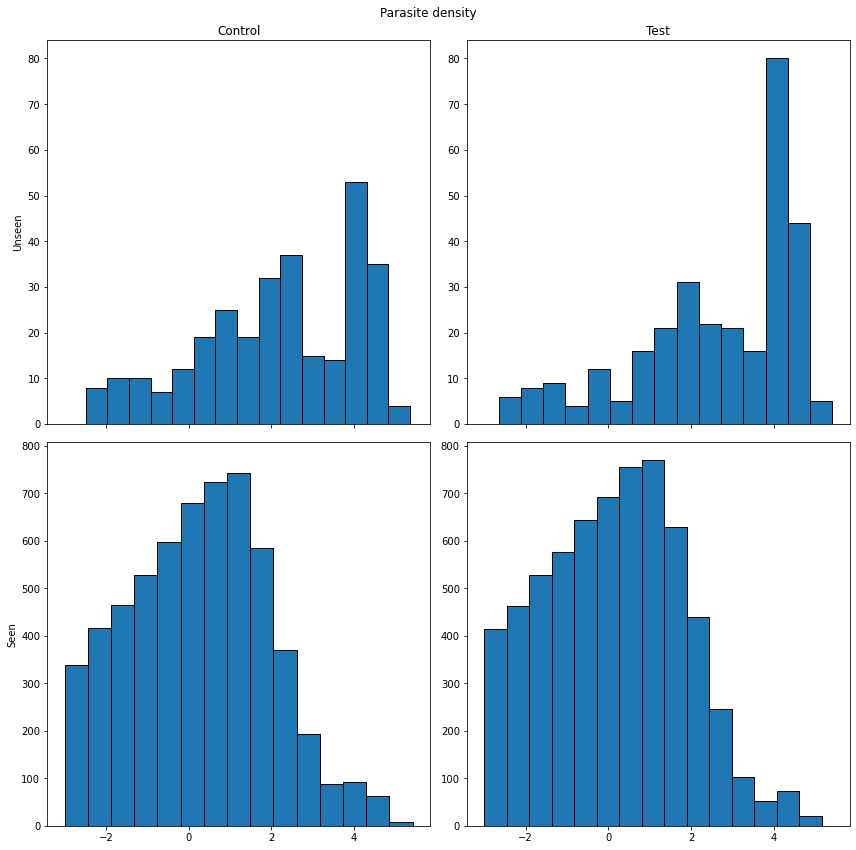

In [28]:
fig,ax = plt.subplots(nrows = 2,ncols=2,sharex=True, tight_layout=True, figsize=(12,12))
ax[0,0].hist(np.log10(pdensity_control_unseen), bins=15, edgecolor = "black")
ax[1,0].hist(np.log10(pdensity_control_seen), bins=15, edgecolor = "black")
ax[0,1].hist(np.log10(pdensity_test_unseen), bins=15, edgecolor = "black")
ax[1,1].hist(np.log10(pdensity_test_seen), bins=15, edgecolor = "black")
ax[0,0].set_title("Control")
ax[0,0].set_ylabel("Unseen")
ax[1,0].set_ylabel("Seen")
ax[0,1].set_title("Test")
fig.suptitle("Parasite density")
ax[0,0].get_shared_y_axes().join(ax[0,0], ax[0,1])
ax[1,0].get_shared_y_axes().join(ax[1,0], ax[1,1])

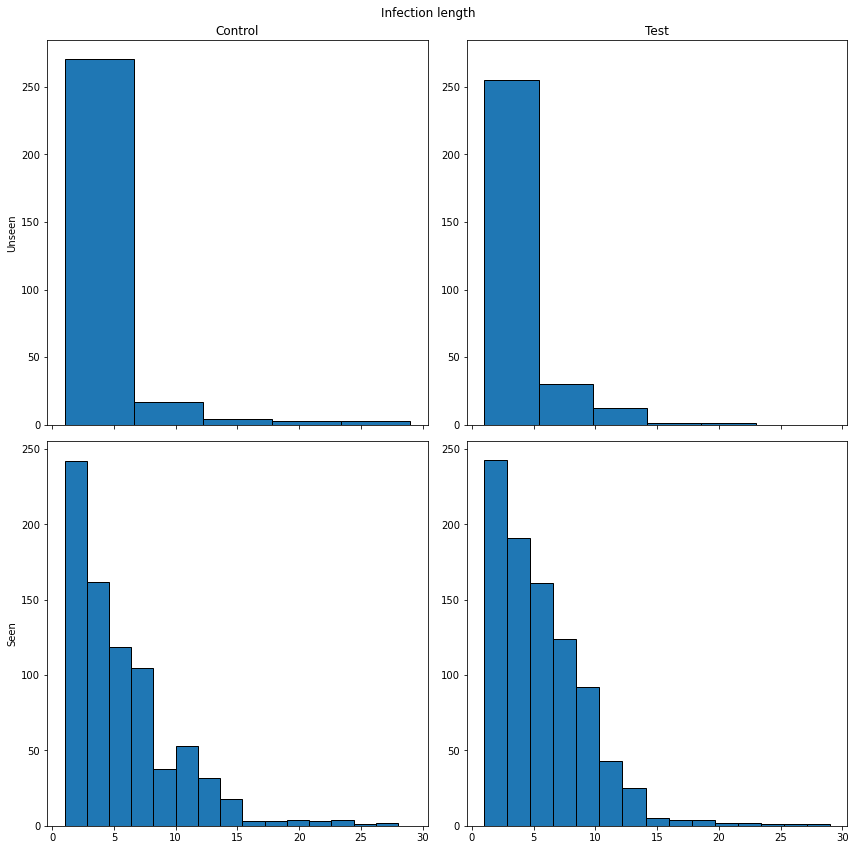

In [29]:
fig,ax = plt.subplots(nrows = 2,ncols=2,sharex=True, tight_layout=True, figsize=(12,12))
ax[0,0].hist(length_control_unseen, bins=5,edgecolor="black")
ax[1,0].hist(length_control_seen, bins=15,edgecolor="black")
ax[0,1].hist(length_test_unseen, bins=5,edgecolor="black")
ax[1,1].hist(length_test_seen, bins=15,edgecolor="black")
ax[0,0].set_title("Control")
ax[0,0].set_ylabel("Unseen")
ax[1,0].set_ylabel("Seen")
ax[0,1].set_title("Test")
fig.suptitle("Infection length")
ax[0,0].get_shared_y_axes().join(ax[0,0], ax[0,1])
ax[1,0].get_shared_y_axes().join(ax[1,0], ax[1,1])

Probably need to cut infection length if infection was treated and only focus on untreated infections.

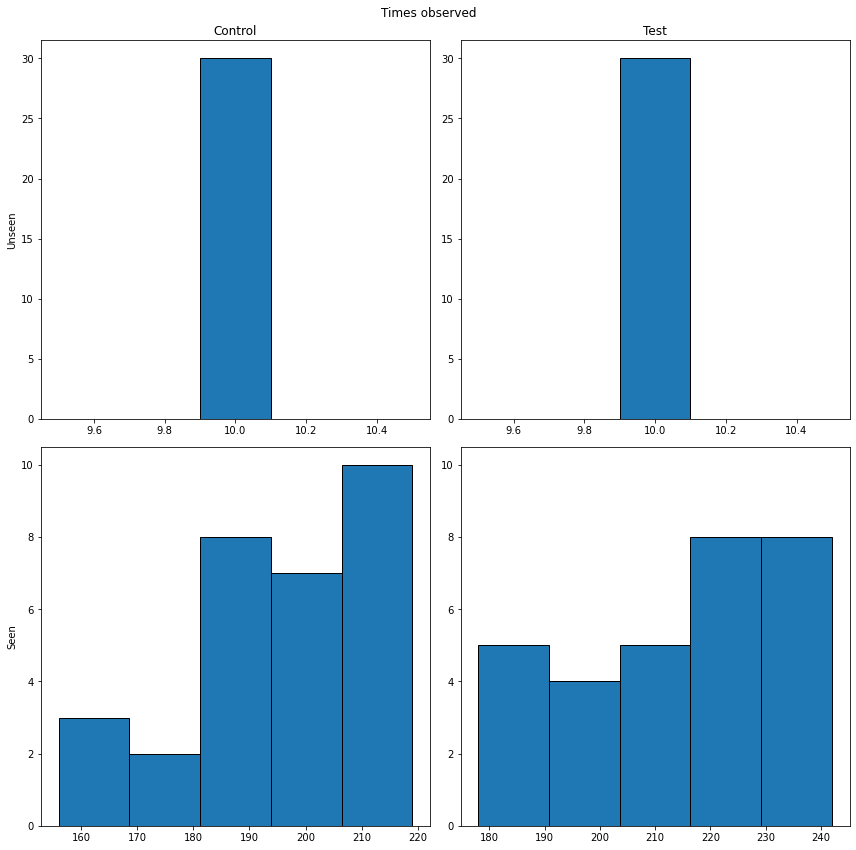

In [30]:
fig,ax = plt.subplots(nrows = 2,ncols=2, tight_layout=True, figsize=(12,12))
ax[0,0].hist(observed[0,0,:], bins=5,edgecolor="black")
ax[1,0].hist(observed[0,1,:], bins=5,edgecolor="black")
ax[0,1].hist(observed[1,0,:], bins=5,edgecolor="black")
ax[1,1].hist(observed[1,1,:], bins=5,edgecolor="black")
ax[0,0].set_title("Control")
ax[0,0].set_ylabel("Unseen")
ax[1,0].set_ylabel("Seen")
ax[0,1].set_title("Test")
fig.suptitle("Times observed")
ax[0,0].get_shared_y_axes().join(ax[0,0], ax[0,1])
ax[1,0].get_shared_y_axes().join(ax[1,0], ax[1,1])

If there's only one antigen, get lots of infections at high parasitemia because immunity never builds up. Maybe need to gain immunity a LOT faster.

In [10]:
def run_simulation(alleles,a,w,n_people,y,fever,breaks):
    for person in range(n_people):                              
        pmatrix, smatrix, imatrix, ivector, malaria = tent.simulate_person(y,a,w,fever,breaks, gamma=gamma,delta=delta)
        
        pdensities = np.zeros((2,alleles))
        seen = np.zeros((2,alleles), dtype=int) # Why alleles + 1? Removed it
        lengths = np.zeros((2,alleles), dtype=int)
        
        visits = list(range(28,y*365,28))
        visits.extend(malaria)
        for t in np.sort(visits):
            control = pmatrix[0,:,t]
            test = pmatrix[-1,:,t]
            
            for i in range(alleles):
                if control[i] > 0:
                    if seen[0,i] == 0:
                        pdensities[0,i] = control[i]
                        seen[0,i] += 1
                    elif seen[0,i] == 1:
                        diff = control[i] - pdensities[0,i]
                        seen[0,i] += 1
                        #pdensities[0,i] = control[i]
                        diff_control.append(diff)
                
                if test[i] > 0:
                    if seen[1,i] == 0:
                        pdensities[1,i] = test[i]
                        seen[1,i] += 1
                    elif seen[1,i] == 1:
                        diff = test[i] - pdensities[1,i]
                        #pdensities[1,i] = control[i]
                        seen[1,i] += 1
                        diff_test.append(diff)
                    
                        
        all_parasites[person,:,:,:] = pmatrix
        all_strain_immunity[person,:,:,:] = imatrix
        all_gen_immunity[person,:] = ivector
        visited[person] = np.sort(visits)

def count_alleles(n_people, loci, visited):
    '''
    Returns count of alleles at each visit.
    '''
    alleles = []
    for person in range(n_people):
        for visit in visited:
        #for visit in visited[person]:
            densities = all_parasites[person,loci,:,visit]
            n = densities[densities!=0].size
            alleles.append(n)
    return np.asarray(alleles)

def allele_freqs(n_people, loci,visited,):
    '''
    Returns frequencies of alleles at each visit.
    '''
    freqs = []
    for person in range(n_people):
        for visit in visited[person]:
            densities = all_parasites[person,loci,:,visit]
            total = np.sum(densities)
            if total > 0:
                frequency = densities/total
                for freq in frequency:
                    if freq != 0:
                        freqs.append(freq)
    return freqs

def get_densities(n_people,loci,visited):
    '''
    Returns parasite densities of alleles at each visit
    '''
    dens = []
    for person in range(n_people):
        for visit in visited[person]:
            p = all_parasites[person,loci,:,visit]
            for density in p:
                if density > 0:
                    dens.append(density)
    return dens

In [11]:
n_people=100
alleles = 10
antigens = 3
y = 5
genetics, weight = create_weight_alleles(antigens,alleles)
print(genetics)
print(weight)

all_parasites = np.zeros((n_people, antigens+1, alleles, y*365))
all_strain_immunity = np.zeros((n_people, antigens+1, alleles, y*365))
all_gen_immunity = np.zeros((n_people,y*365))
diff_control = []
diff_test = []
visited = {}

run_simulation(alleles,genetics,weight,n_people,y,fever,breaks)

[10 10 10 10]
[0.         0.         0.33333333 0.33333333 0.33333333]


In [64]:
routine = list(range(28,y*365,28))
n_alleles = {}
n_alleles['control'] = count_alleles(n_people,0,routine)
n_alleles['test'] = count_alleles(n_people,-1,routine)

In [42]:
n_alleles

{'control': array([3, 0, 1, ..., 2, 4, 4]),
 'test': array([3, 0, 1, ..., 2, 4, 4])}

In [43]:
freqs = {}
freqs['control'] = allele_freqs(n_people,0,visited)
freqs['test'] = allele_freqs(n_people,-1,visited)

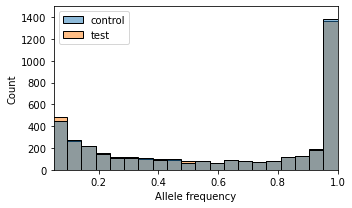

In [44]:
fig, ax = plt.subplots(figsize = ( 5 , 3 ), tight_layout=True, facecolor = (1,1,1,))
sns.histplot(data=freqs, ax=ax)
ax.set_xlabel('Allele frequency')
ax.set_xlim(0.05,1)
ax.set_ylim(0,1500)
fig.savefig("allele_freq.pdf", bbox_inches="tight")

In [55]:
diff = {}
diff['control'] = diff_control
diff['test'] = diff_test

Text(0.5, 0, '# of alleles')

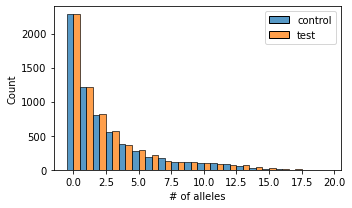

In [65]:
fig, ax = plt.subplots(figsize = ( 5 , 3 ), tight_layout=True, facecolor = (1,1,1,))
sns.histplot(data=n_alleles, ax=ax,multiple='dodge',discrete=True)
ax.set_xlabel('# of alleles')
#fig.savefig("n_of_alleles.pdf", bbox_inches="tight")

Text(0.5, 0, '# of alleles')

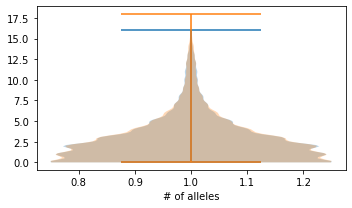

In [51]:
fig, ax = plt.subplots(figsize = ( 5 , 3 ), tight_layout=True, facecolor = (1,1,1,))
ax.violinplot(dataset=n_alleles['control'])
ax.violinplot(dataset=n_alleles['test'])
ax.set_xlabel('# of alleles')
#fig.savefig("n_of_alleles.pdf", bbox_inches="tight")

In [66]:
st.ranksums(n_alleles['control'], n_alleles['test'])

RanksumsResult(statistic=-0.044863407509597074, pvalue=0.9642161840376985)

In [16]:
pdens = {}
pdens['control'] = get_densities(n_people,0,visited)
pdens['test'] = get_densities(n_people,-1,visited)

In [24]:
len(freqs['test'])

38440

In [ ]:
fig, ax = plt.subplots(figsize = ( 5 , 3 ), tight_layout=True, facecolor = (1,1,1,))
sns.histplot(data=pdens, ax=ax)
ax.set_xlabel('Parasite density')
#fig.savefig("n_of_alleles.pdf", bbox_inches="tight")

In [ ]:
fig, ax = plt.subplots(figsize = ( 5 , 3 ), tight_layout=True, facecolor = (1,1,1,))
sns.histplot(data=diff, ax=ax, log_scale=False)
ax.set_xlabel(r'$\Delta$ parasite density (parasites/uL)')
ax.set_title('After 1 exposures')
ax.set_xlim(-100000, 100000)
ax.set_ylim(0,80)

#fig.savefig("one-exposure-hist-zoomed.pdf", bbox_inches="tight")

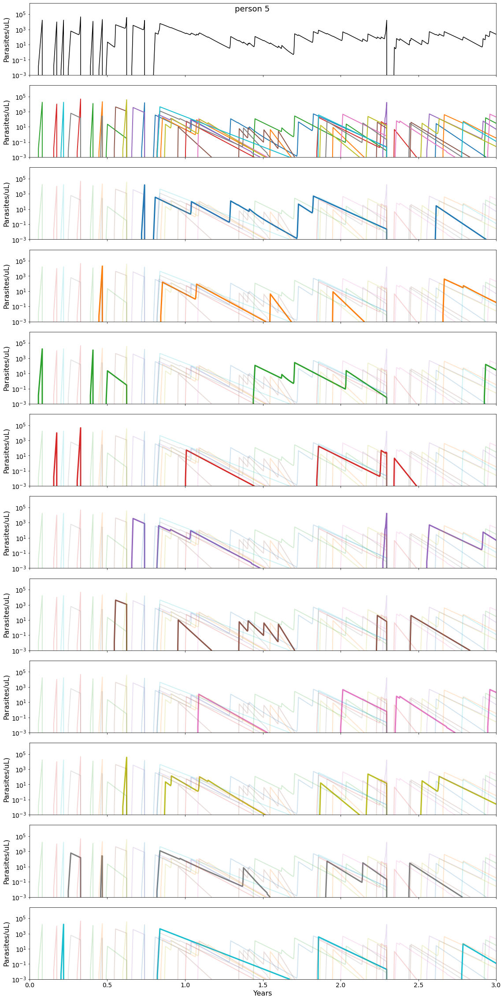

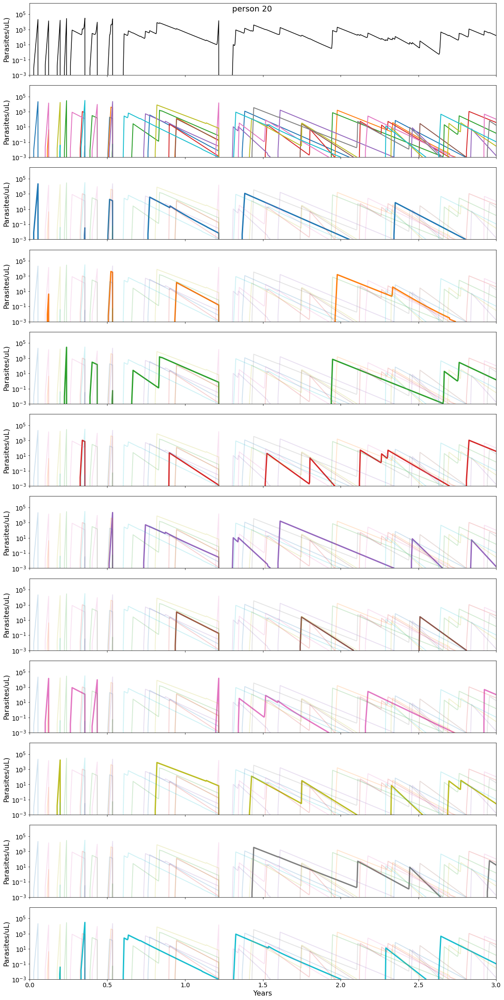

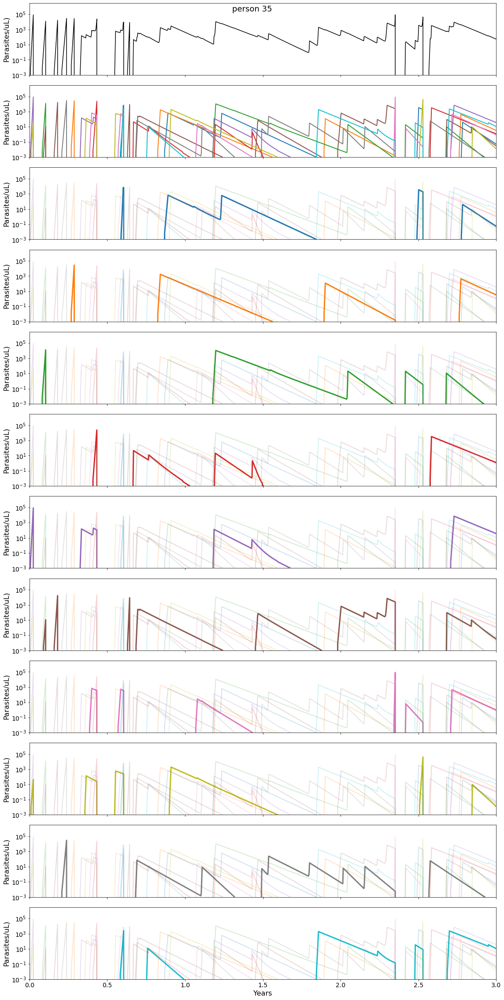

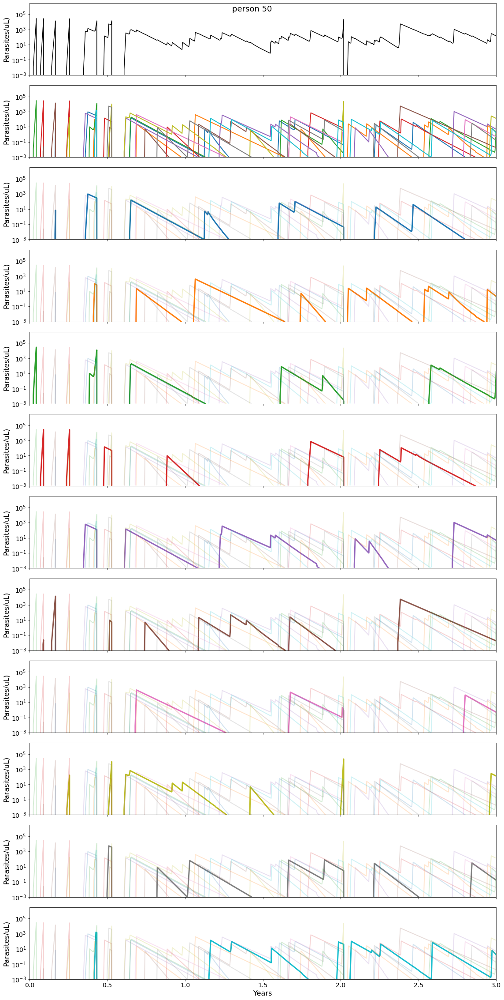

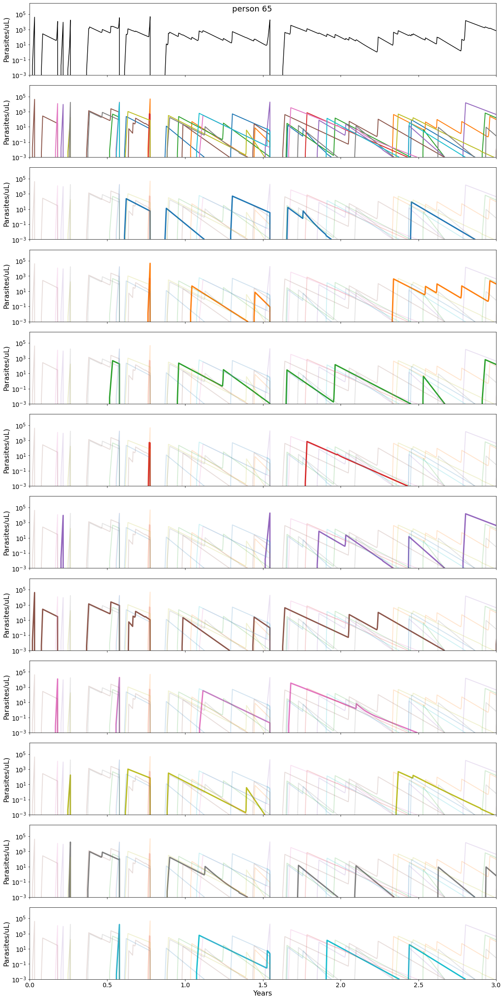

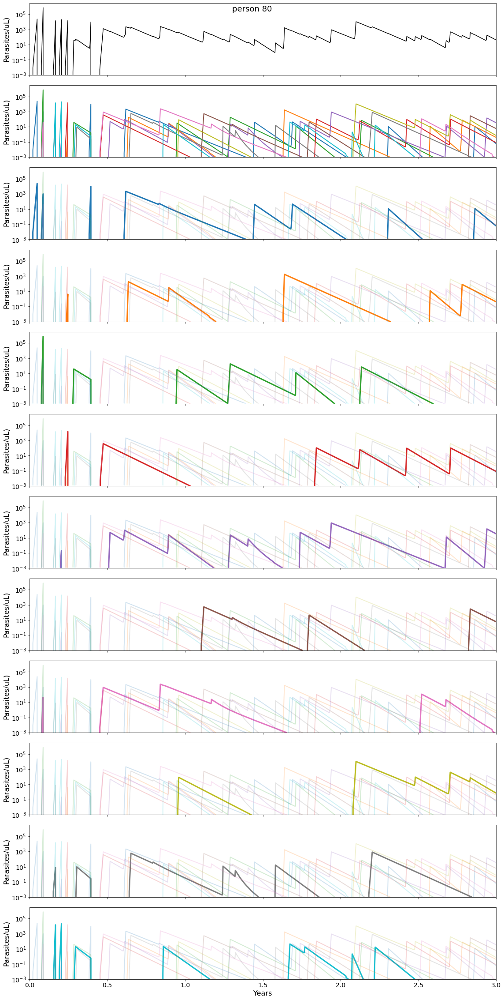

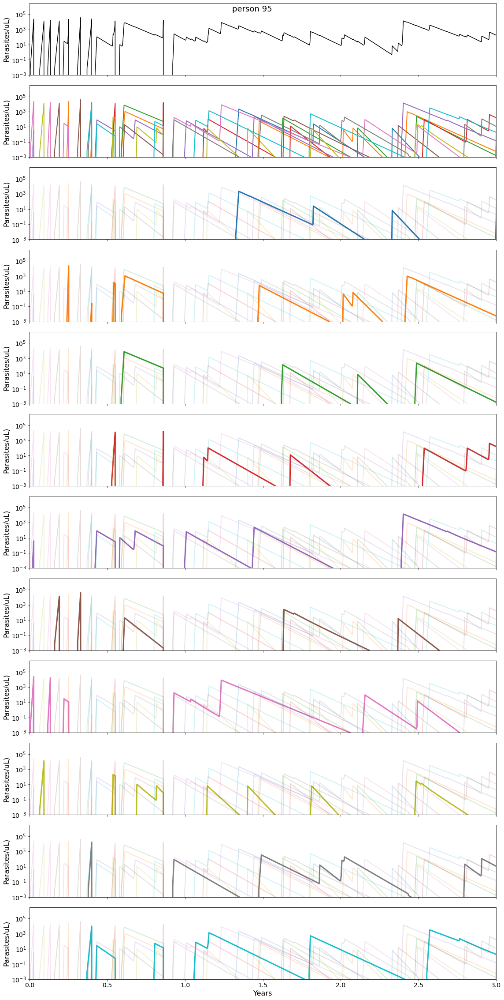

In [25]:
colors = {0:"tab:blue", 1:"tab:orange", 2:"tab:green", 3:"tab:red", 4:"tab:purple", 5:"tab:brown", 6:"tab:pink",7:"tab:olive",8:"tab:grey",9:"tab:cyan"}

for i in range(5,n_people,15):
    fig, ax = plt.subplots(nrows=12, sharey=True, sharex=True, tight_layout=True, figsize=(16,32))
    ax[0].tick_params(axis='both', which='major', labelsize=14)
    ax[1].tick_params(axis='both', which='major', labelsize=14)
    ax[0].set_yscale('log')
    ax[0].plot(np.arange(y*365)/365, all_parasites[i,-1,:,:].sum(axis=0),color="black")
    for strain in np.arange(10):
        iStrain = all_parasites[i,-1,strain,:]
        if np.sum(iStrain) > 1:
            ax[1].plot(np.arange(y*365)/365, iStrain, linewidth=2,color=colors[strain])
    ax[0].set_ylim(0.001,3000000)
    ax[0].set_xlim(0,3)
    fig.suptitle('person ' + str(i),fontsize=18)
    ax[11].set_xlabel('Years',fontsize=16)
    ax[0].set_ylabel('Parasites/uL)',fontsize=16)
    #ax[0].set_title('Total parasite density')
    #ax[1].set_title('Parasite density colored by allele at test locus')
    ax[1].set_ylabel('Parasites/uL)',fontsize=16)
    for row in range(2,12):
        ax[row].tick_params(axis='both', which='major', labelsize=14)
        ax[row].set_ylabel('Parasites/uL)',fontsize=16)
        other = [strain for strain in range(0,10) if strain != row-2]
        ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,row-2,:],linewidth=3,color=colors[row-2])
        #ax[row].vlines(x=visited[i]/365,ymin=0.001,ymax=100000,color="black",linestyle="dashed",linewidth=1)
        
        for strain in other:
            ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,strain,:],linewidth=2,alpha=0.2,color=colors[strain])
        
        #ax2 = ax[row].twinx()
        #ax2.set_ylabel('Strain immunity',fontsize=16)
        #ax2.plot(np.arange(y*365)/365, all_strain_immunity[i,-1,row-2,:],linewidth=1.5,color='black',linestyle='dashed')
        
#fig.savefig("test-loci-trajectory.pdf", bbox_inches="tight")

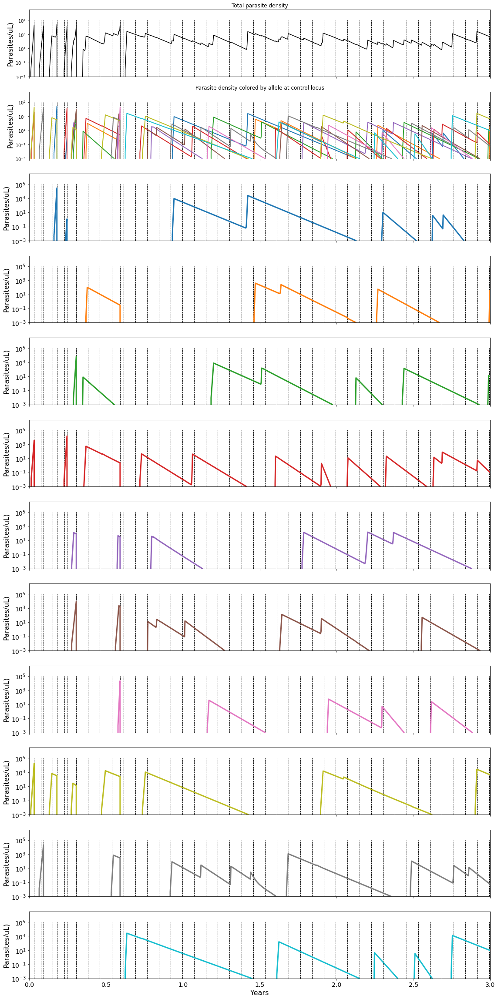

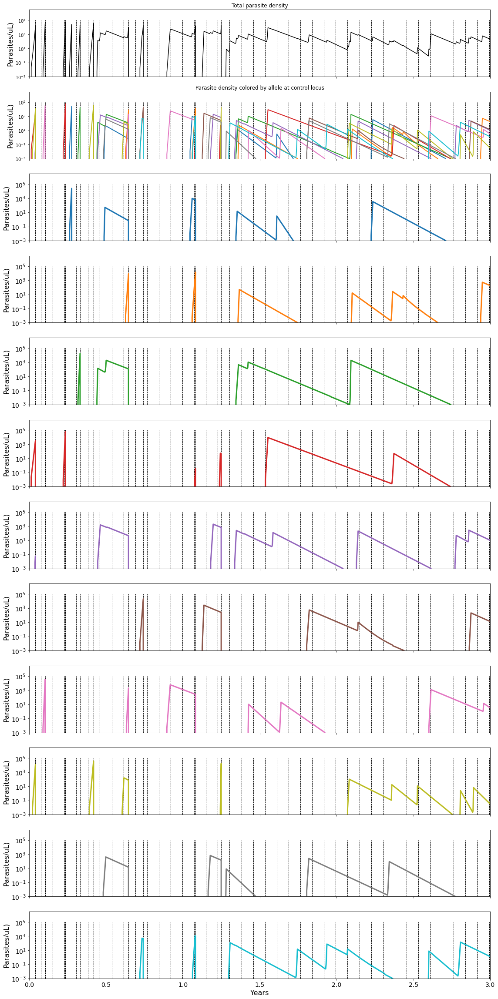

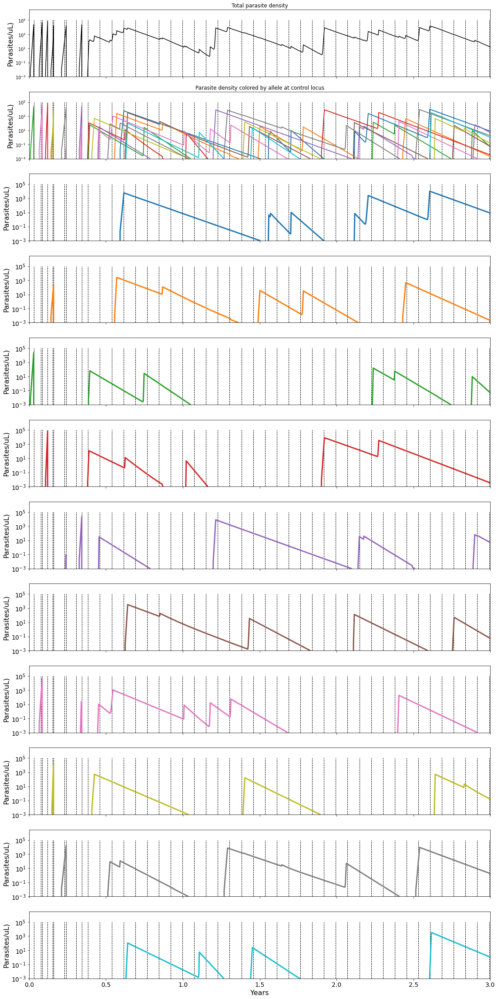

In [14]:
for i in range(5,n_people,40):
    fig, ax = plt.subplots(nrows=12, sharey=True, sharex=True, tight_layout=True, figsize=(16,32))
    #ax[0].tick_params(axis='both', which='major', labelsize=14)
    #ax[1].tick_params(axis='both', which='major', labelsize=14)
    ax[0].set_yscale('log')
    ax[0].plot(np.arange(y*365)/365, all_parasites[i,-1,:,:].sum(axis=0),color="black")
    for strain in np.arange(10):
        iStrain = all_parasites[i,-1,strain,:]
        if np.sum(iStrain) > 1:
            ax[1].plot(np.arange(y*365)/365, iStrain, linewidth=2,color=colors[strain])
    ax[0].set_ylim(0.001,3000000)
    ax[0].set_xlim(0,3)
    #fig.suptitle('person ' + str(i),fontsize=18)
    ax[11].set_xlabel('Years',fontsize=16)
    ax[0].set_ylabel('Parasites/uL)',fontsize=16)
    ax[0].set_title('Total parasite density')
    ax[1].set_title('Parasite density colored by allele at control locus')
    ax[1].set_ylabel('Parasites/uL)',fontsize=16)
    ax[0].vlines(x=visited[i]/365,ymin=0.001,ymax=100000,color="black",linestyle="dashed",linewidth=1)
    ax[1].vlines(x=visited[i]/365,ymin=0.001,ymax=100000,color="black",linestyle="dashed",linewidth=1)

    for row in range(2,12):
        ax[row].tick_params(axis='both', which='major', labelsize=14)
        ax[row].set_ylabel('Parasites/uL)',fontsize=16)
        other = [strain for strain in range(0,10) if strain != row-2]
        ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,row-2,:],linewidth=3,color=colors[row-2])
        ax[row].vlines(x=visited[i]/365,ymin=0.001,ymax=100000,color="black",linestyle="dashed",linewidth=1)
        
        #for strain in other:
         #   ax[row].plot(np.arange(y*365)/365, all_parasites[i,-1,strain,:],linewidth=2,alpha=0.2,color=colors[strain])
        
        #ax2 = ax[row].twinx()
        #ax2.set_ylabel('Strain immunity',fontsize=16)
        #ax2.plot(np.arange(y*365)/365, all_strain_immunity[i,0,row-2,:],linewidth=1.5,color='black',linestyle='dashed')
        
    fig.savefig("test-loci-trajectory"+str(i)+ ".pdf", bbox_inches="tight")